# Setup

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
from PIL import Image

import numpy as np
import matplotlib.pyplot as plt

import segmate

# High Resolution Semantic Change Detection Dataset

In [3]:
dataset_dir = "/ssd003/projects/aieng/public/semantic_change_detection_small_dataset"
images_2006 = "images_2006/D14"
images_2012 = "images_2012/D14"
labels_change = "labels_change/D14"
land_cover_labels_2006 = "land_cover_labels_2006/D14"
land_cover_labels_2012 = "land_cover_labels_2012/D14"

value_replacements = {
    0: 0,
    1: 50,
    2: 100,
    3: 150,
    4: 200,
    5: 250
}

labels = {
    0: 'No Information',
    1: 'Artificial Surfaces',
    2: 'Agricultural Areas',
    3: 'Forests',
    4: 'Wetlands',
    5: 'Water'
}

In [4]:
signature = "0440-6915"

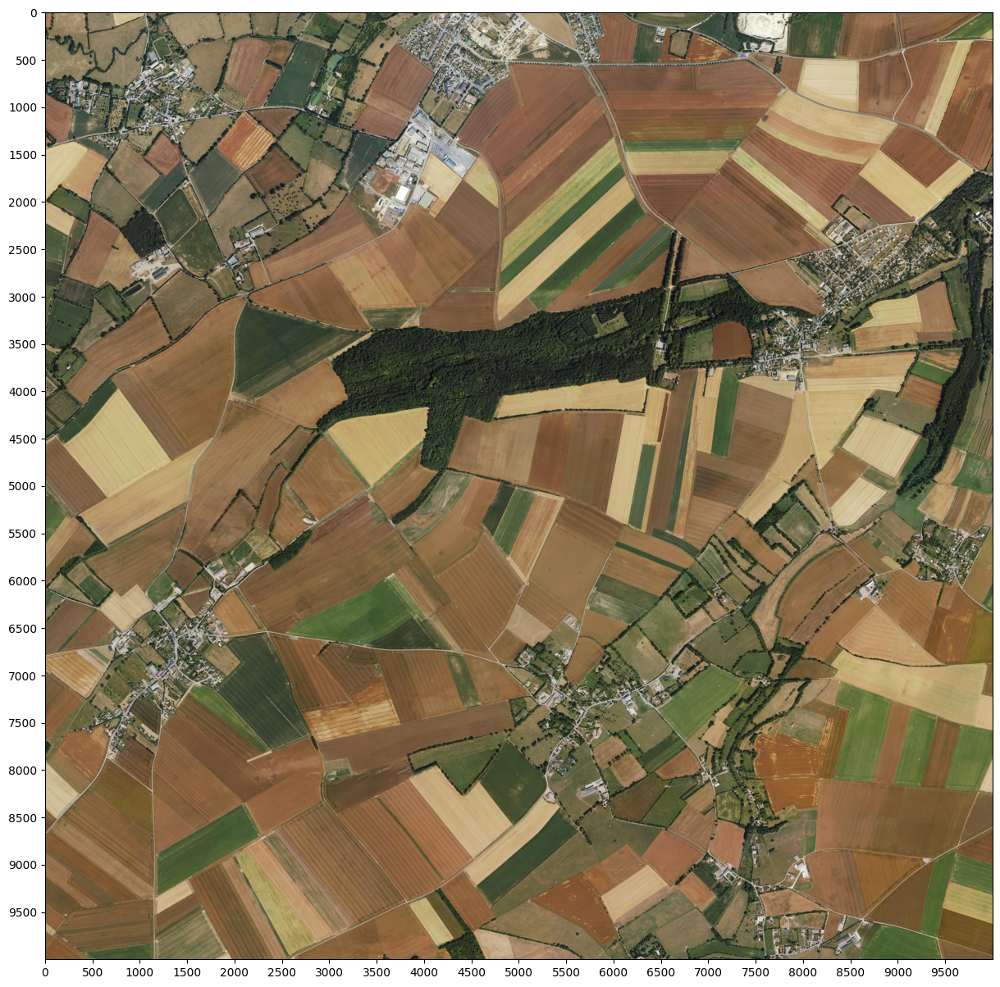

In [5]:
old_img_path = f"{dataset_dir}/{images_2006}/14-2005-{signature}-LA93.tif"
old_image = segmate.utils.load_image(old_img_path)
segmate.utils.show_image(old_image, size=15, show_axis=True)

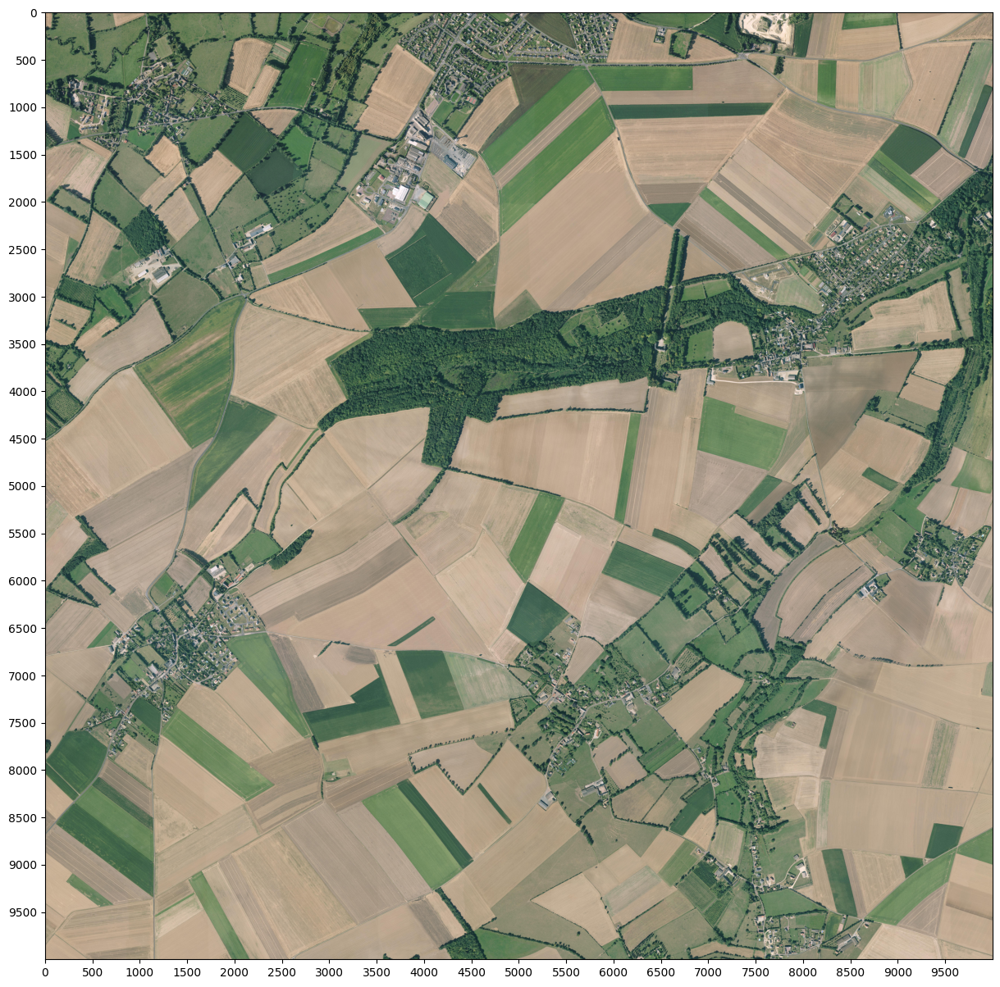

In [6]:
new_img_path = f"{dataset_dir}/{images_2012}/14-2012-{signature}-LA93-0M50-E080.tif"
new_image = segmate.utils.load_image(new_img_path)
segmate.utils.show_image(new_image, size=15, show_axis=True)

# Deforestation Detection

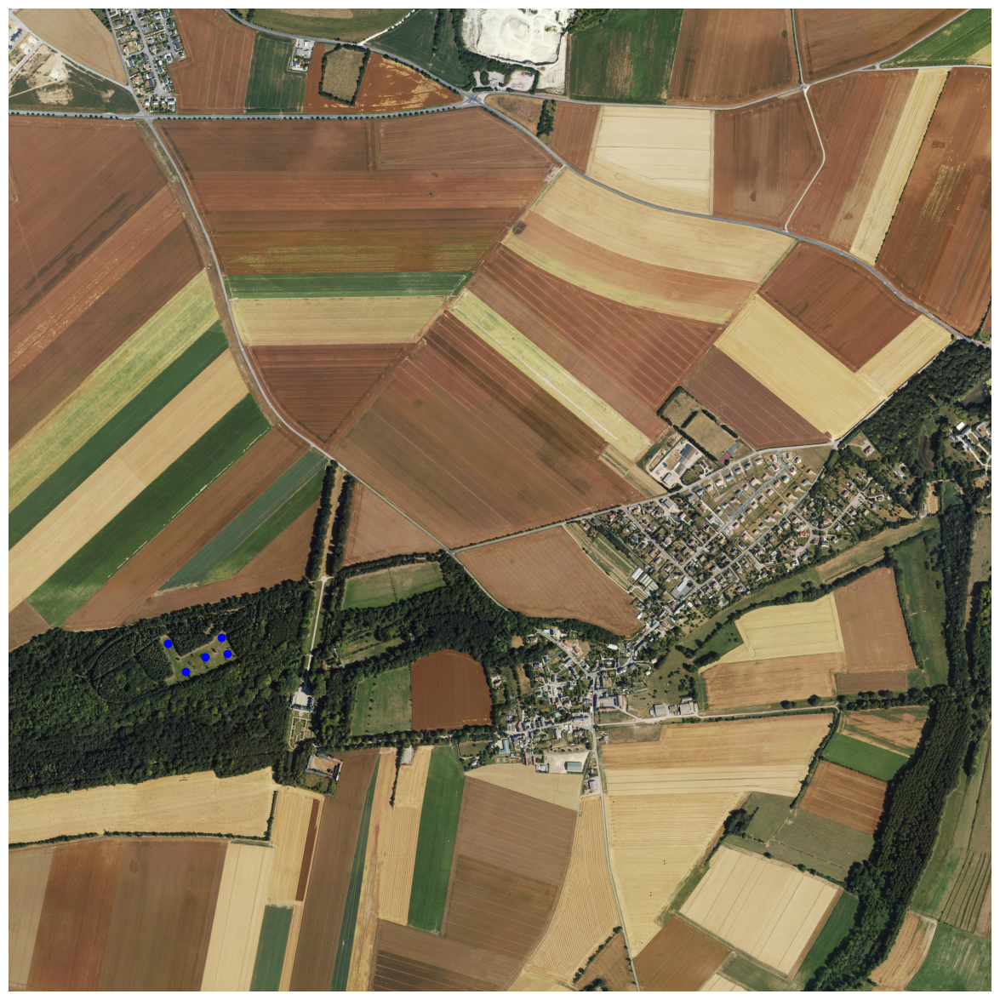

In [7]:
height, width, _ = old_image.shape
top_right_old = old_image[:height//2, width//2:, :]

old_point_coords = [
    [810, 3230], [900, 3370], [1080, 3200], [1000, 3300], [1110, 3280],
]

old_point_labels = [
    1, 1, 1, 1, 1,
]

segmate.utils.show_image(top_right_old, size=15, points=(old_point_coords, old_point_labels))

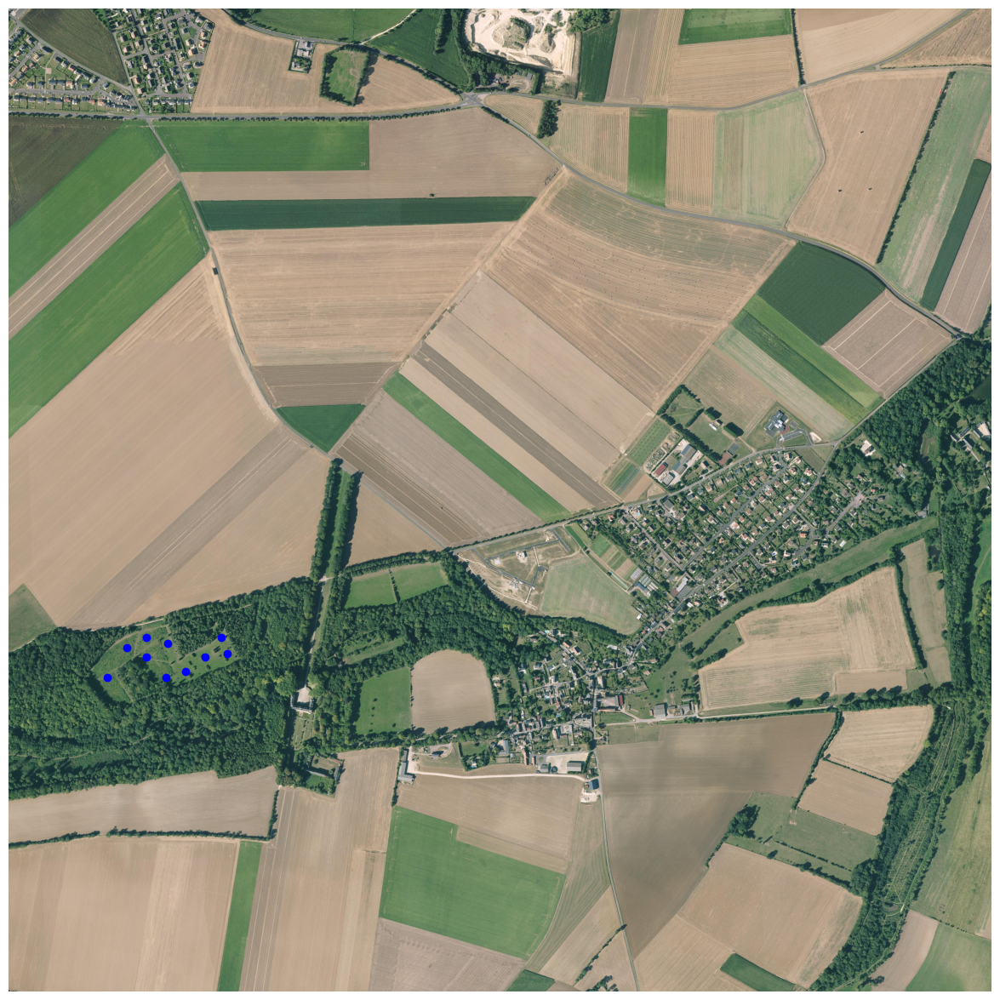

In [8]:
top_right_new = new_image[:height//2, width//2:, :]

new_point_coords = [
    [810, 3230], [900, 3370], [1080, 3200], [1000, 3300], [1110, 3280],
    [500, 3400], [600, 3250], [700, 3300], [700, 3200], [800, 3400]
]

new_point_labels = [
    1, 1, 1, 1, 1,
    1, 1, 1, 1, 1
]

segmate.utils.show_image(top_right_new, size=15, points=(new_point_coords, new_point_labels))

## Segmentation

In [9]:
sam = segmate.segmenter.SAM(model_type='vit_h', checkpoint='/ssd003/projects/aieng/image_models/sam_vit_h.pth')

### Old Image

In [10]:
old_masks = sam.segment(top_right_old, points_prompt=(np.array(old_point_coords), np.array(old_point_labels)))

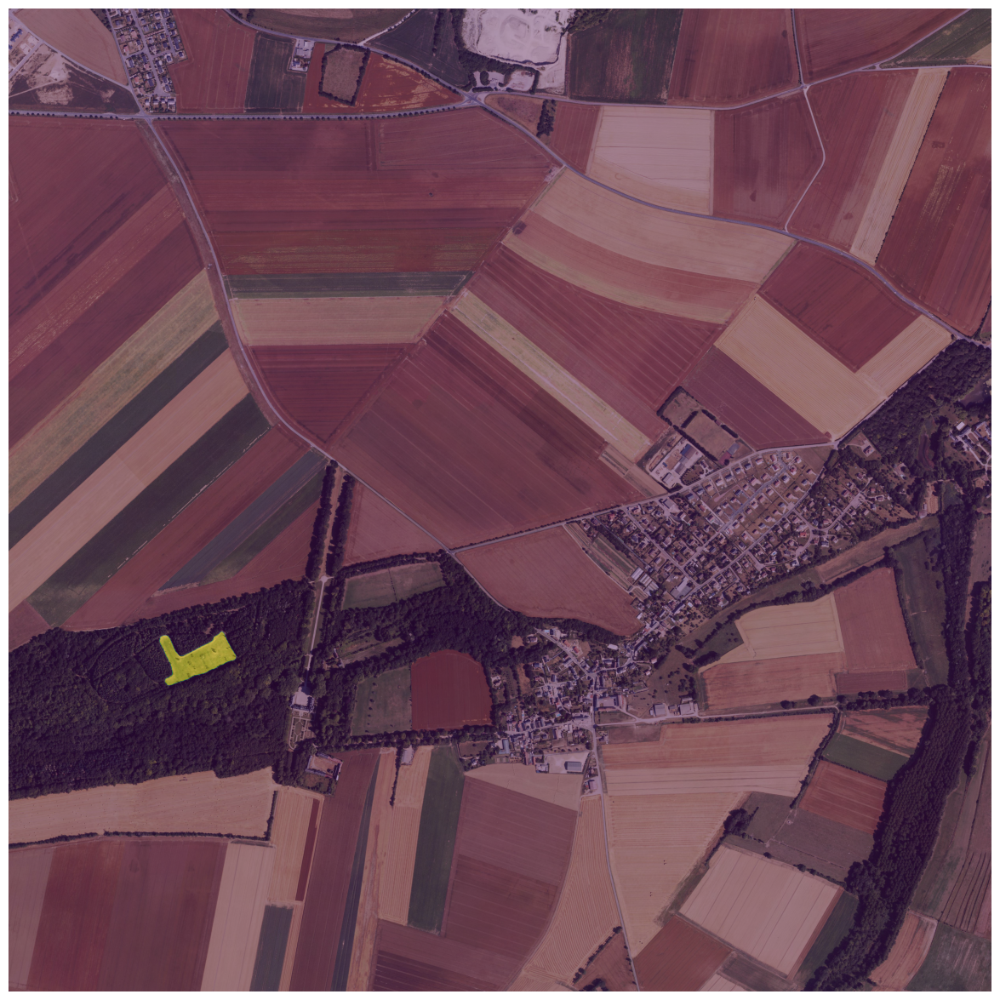

In [11]:
segmate.utils.show_masks(top_right_old, old_masks, size=15)

### New Image

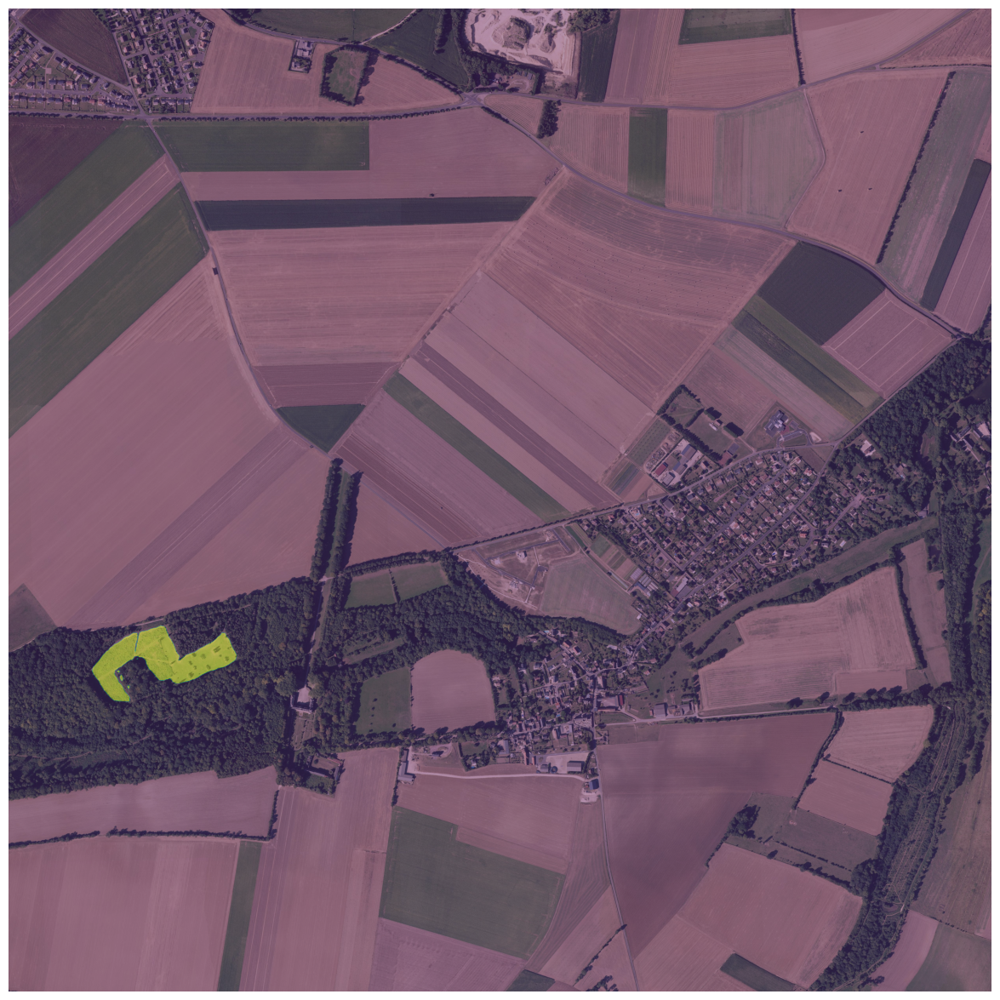

In [12]:
new_masks = sam.segment(top_right_new, points_prompt=(np.array(new_point_coords), np.array(new_point_labels)))
segmate.utils.show_masks(top_right_new, new_masks, size=15)

## Deforestation Progress

In [13]:
old_mask_size = segmate.utils.get_masks_size(old_masks)
old_mask_size

20.265600000000003

In [14]:
new_mask_size = segmate.utils.get_masks_size(new_masks)
new_mask_size

49.178399999999996

In [15]:
new_mask_size / old_mask_size

2.426693510184746

### Visualize the Difference

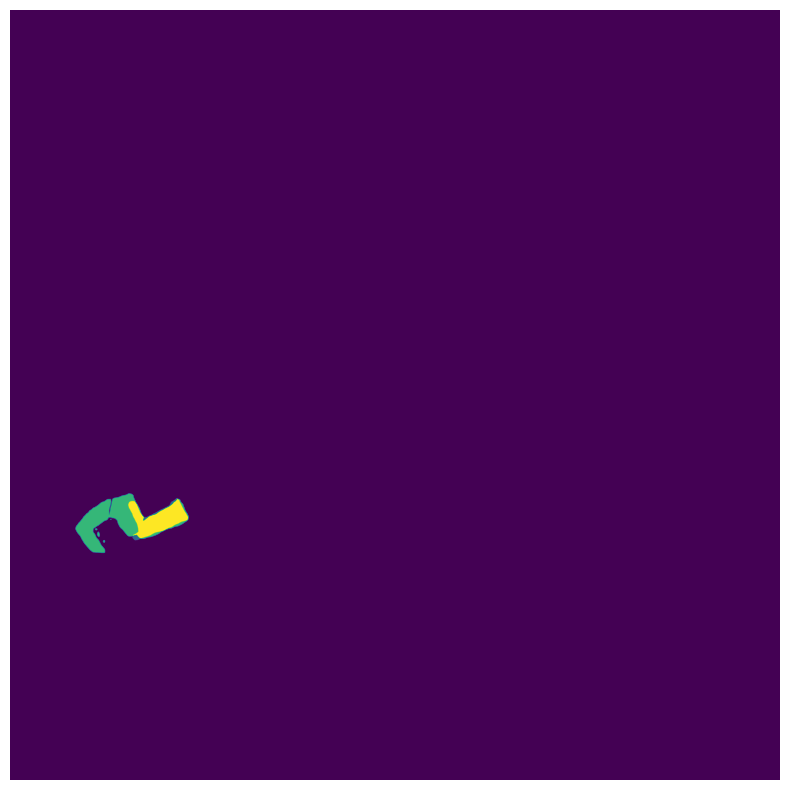

In [16]:
segmate.utils.plot_mask_diff(old_masks, new_masks, size=10)